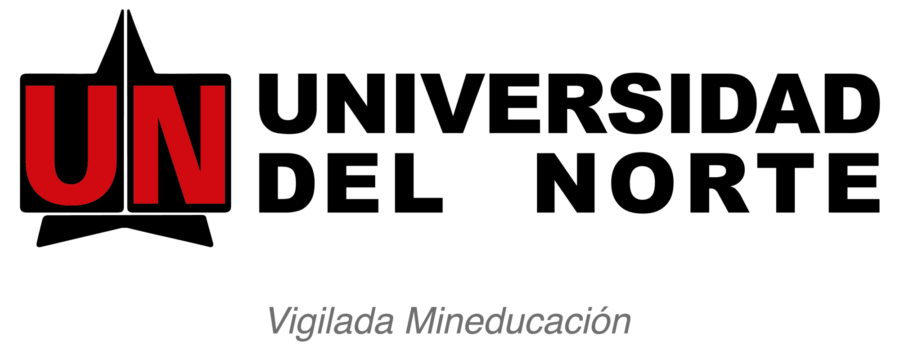

# PROYECTO FINAL

Presentado por:

David Meza - 200166063

Aaron Rodriguez - 200166073

Juan Maestre - 200162201

Edinson Noriega -

# Imports y dependencias


In [ ]:
!pip install umap-learn

In [ ]:
import pandas as pd
import numpy as np
import umap
from sklearn.cluster import DBSCAN
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Codigo

## Carga del dataset


In [ ]:
# Carga de datos
df = pd.read_csv('ibtracsLast3years.csv')

# Eliminamos la primera fila, que contiene unidades de medida en lugar de datos
df.drop(df.index[0], inplace=True)

# Inspección inicial del DataFrame: todos los tipos vienen como 'object' o mezclados
df.info()

<ipython-input-3-5ff8b39f86c6>:2: DtypeWarning: Columns (1,2,8,9,14,172,173) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('ibtracsLast3years.csv')


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18354 entries, 1 to 18354
Columns: 174 entries, SID to STORM_DIR
dtypes: int64(1), object(173)
memory usage: 24.4+ MB


In [ ]:
# Definición de variable objetivo
y = ['USA_WIND']  # Target: velocidad del viento en EE.UU.

# Definición de variables de entrada
xy = ['USA_WIND', 'SEASON', 'BASIN', 'SUBBASIN', 'ISO_TIME', 'NATURE', 'DIST2LAND', "LANDFALL",
      'USA_LAT', 'USA_LON', 'USA_RECORD', 'USA_STATUS', 'USA_PRES', 'USA_SSHS',
      'USA_R34_NE', 'USA_R34_SE', 'USA_R34_SW', 'USA_R34_NW',
      'USA_R50_NE', 'USA_R50_SE', 'USA_R50_SW', 'USA_R50_NW',
      'USA_R64_NE', 'USA_R64_SE', 'USA_R64_SW', 'USA_R64_NW']

# Creamos una copia del DataFrame original para limpieza y visualización
df_ = df[xy]

## EDA y transformaciones

In [ ]:
# Exploración de valores únicos por columna
columnas = list(df_.keys())

for i in columnas:
    print(i)
    print(df_[i].unique())
    print("---------")

USA_WIND
['20' '23' '25' '28' '30' '33' '35' '40' '45' '50' '55' '58' '60' '53'
 '38' '18' '15' ' ' '43' '48' '70' '90' '78' '65' '75' '80' '85' '93' '95'
 '88' '68' '98' '105' '113' '120' '123' '125' '118' '115' '110' '108'
 '103' '100' '73' '63' '83' '72' '31' '128' '130' '133' '135' '145' '140'
 '138' '59' '97' '87' '81' '109' '112' '122' '10' '13' '67' '71' '107'
 '79' '62' '143' '150' '155' '160' '165' '163' '153' '66' '69' '77' '76'
 '52' '111' '114' '57' '82' '32' '37' '39' '51' '54' '64' '74' '84' '104'
 '117' '119' '99' '116' '42' '89' '91' '101' '56' '29' '27' '102' '94'
 '96' '34' '47' '19' '22' '86' '106' '124' '46' '44' '126' '92' '61' '144'
 '136' '139' '49' '36' '16' '129' '21' '24' '134' '131']
---------
SEASON
['2022' '2023' 2022 2023 2024 2025]
---------
BASIN
['SP' 'SI' 'NI' 'WP' 'EP' nan]
---------
SUBBASIN
['EA' 'WA' 'MM' 'BB' 'CP' nan 'GM' 'CS' 'AS']
---------
ISO_TIME
['2022-01-08 00:00:00' '2022-01-08 03:00:00' '2022-01-08 06:00:00' ...
 '2025-04-22 06:00:00' '2

In [ ]:
# Confirmamos que los tipos de datos siguen siendo incorrectos (object o mezclados)
df_.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18354 entries, 1 to 18354
Data columns (total 26 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   USA_WIND    18354 non-null  object
 1   SEASON      18354 non-null  object
 2   BASIN       15057 non-null  object
 3   SUBBASIN    15753 non-null  object
 4   ISO_TIME    18354 non-null  object
 5   NATURE      18354 non-null  object
 6   DIST2LAND   18354 non-null  object
 7   LANDFALL    18354 non-null  object
 8   USA_LAT     18354 non-null  object
 9   USA_LON     18354 non-null  object
 10  USA_RECORD  18354 non-null  object
 11  USA_STATUS  18354 non-null  object
 12  USA_PRES    18354 non-null  object
 13  USA_SSHS    18354 non-null  int64 
 14  USA_R34_NE  18354 non-null  object
 15  USA_R34_SE  18354 non-null  object
 16  USA_R34_SW  18354 non-null  object
 17  USA_R34_NW  18354 non-null  object
 18  USA_R50_NE  18354 non-null  object
 19  USA_R50_SE  18354 non-null  object
 20  USA_R5

In [ ]:
# Conversión manual de tipos de columnas categóricas conocidas
df_ = df_.astype({
    'SEASON': 'int',
    'BASIN': 'str',
    'SUBBASIN': 'str',
    'USA_RECORD': 'str',
    'USA_STATUS': 'str',
    'NATURE': 'str'
})

# Lista de columnas con valores numéricos que contienen errores como '-99' o cadenas vacías
columns_to_fix = ['USA_LAT', 'USA_LON', 'USA_PRES', 'USA_SSHS', 'USA_R34_NE', 'USA_R34_SE', 'USA_R34_SW',
                  'USA_R34_NW', 'USA_R50_NE', 'USA_R50_SE', 'USA_R50_SW', 'USA_R50_NW', 'USA_R64_NE',
                  'USA_R64_SE', 'USA_R64_SW', 'USA_R64_NW', 'USA_WIND', 'DIST2LAND', 'LANDFALL']

# Limpieza de esas columnas: reemplazo de valores no válidos por NaN, y conversión a tipo numérico
for col in columns_to_fix:
    df_[col] = df_[col].replace([' ', '-99', -99], np.nan)
    df_[col] = pd.to_numeric(df_[col], errors='coerce')
    # No se imputan valores faltantes para evitar introducir ruido: se eliminarán las filas con NaN

# Conversión de la columna temporal a formato datetime
df_['ISO_TIME'] = pd.to_datetime(df_['ISO_TIME'], errors='coerce')

# Eliminación de filas con valores faltantes
df_.dropna(inplace=True)

In [ ]:
# Verificamos que ahora los tipos de datos son correctos y no hay valores nulos
df_.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2638 entries, 234 to 16719
Data columns (total 26 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   USA_WIND    2638 non-null   float64       
 1   SEASON      2638 non-null   int64         
 2   BASIN       2638 non-null   object        
 3   SUBBASIN    2638 non-null   object        
 4   ISO_TIME    2638 non-null   datetime64[ns]
 5   NATURE      2638 non-null   object        
 6   DIST2LAND   2638 non-null   int64         
 7   LANDFALL    2638 non-null   float64       
 8   USA_LAT     2638 non-null   float64       
 9   USA_LON     2638 non-null   float64       
 10  USA_RECORD  2638 non-null   object        
 11  USA_STATUS  2638 non-null   object        
 12  USA_PRES    2638 non-null   float64       
 13  USA_SSHS    2638 non-null   int64         
 14  USA_R34_NE  2638 non-null   float64       
 15  USA_R34_SE  2638 non-null   float64       
 16  USA_R34_SW  2638 non-null 

In [ ]:
# Columnas numéricas seleccionadas
col_num = ['USA_WIND', 'SEASON', 'DIST2LAND', 'LANDFALL',
           'USA_LAT', 'USA_LON', 'USA_PRES', 'USA_SSHS',
           'USA_R34_NE', 'USA_R34_SE', 'USA_R34_SW', 'USA_R34_NW',
           'USA_R50_NE', 'USA_R50_SE', 'USA_R50_SW', 'USA_R50_NW',
           'USA_R64_NE', 'USA_R64_SE', 'USA_R64_SW', 'USA_R64_NW']

# Columnas categóricas seleccionadas
col_cat = ['BASIN', 'SUBBASIN', 'USA_RECORD', 'USA_STATUS', 'NATURE']

In [ ]:
# Estadísticas descriptivas de las variables numéricas
df_[col_num].describe()

,USA_WIND,SEASON,DIST2LAND,LANDFALL,USA_LAT,USA_LON,USA_PRES,USA_SSHS,USA_R34_NE,USA_R34_SE,USA_R34_SW,USA_R34_NW,USA_R50_NE,USA_R50_SE,USA_R50_SW,USA_R50_NW,USA_R64_NE,USA_R64_SE,USA_R64_SW,USA_R64_NW
count,2638.000000,2638.000000,2638.000000,2638.000000,2638.000000,2638.000000,2638.000000,2638.000000,2638.000000,2638.000000,2638.000000,2638.000000,2638.000000,2638.000000,2638.000000,2638.000000,2638.000000,2638.000000,2638.000000,2638.000000
mean,92.626990,2022.849128,769.534496,752.696361,14.657506,8.309742,961.832449,2.155421,119.597043,114.314253,93.593252,102.916603,60.059136,57.696361,47.632676,52.325246,31.344579,30.302502,23.775588,26.075815
std,20.920937,0.667790,640.898106,640.721710,17.087739,103.053023,18.431086,1.411298,61.911299,63.117855,52.304100,50.096735,32.576847,34.348797,29.914612,28.919690,18.998151,21.043129,18.129262,17.079959
min,65.000000,2022.000000,0.000000,0.000000,-29.300000,-179.800000,891.000000,-4.000000,28.000000,20.000000,0.000000,25.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,75.000000,2022.000000,228.250000,205.500000,13.700000,-84.700000,950.000000,1.000000,75.000000,70.000000,55.000000,70.000000,40.000000,30.000000,30.000000,30.000000,20.000000,15.000000,10.000000,15.000000
50%,90.000000,2023.000000,595.000000,580.000000,18.400000,-37.350000,965.000000,2.000000,100.000000,100.000000,80.000000,90.000000,50.000000,50.000000,40.000000,45.000000,25.000000,25.000000,20.000000,24.500000
75%,107.000000,2023.000000,1216.750000,1195.750000,24.200000,116.575000,976.000000,3.000000,150.000000,150.000000,120.000000,130.000000,73.000000,78.000000,60.000000,65.000000,40.000000,40.000000,33.000000,35.000000
max,165.000000,2024.000000,2587.000000,2567.000000,54.700000,179.800000,995.000000,5.000000,420.000000,600.000000,540.000000,450.000000,300.000000,240.000000,270.000000,190.000000,145.000000,175.000000,120.000000,100.000000


In [ ]:
# Estadísticas descriptivas de las variables categóricas
df_.describe(include='object')

,BASIN,SUBBASIN,NATURE,USA_RECORD,USA_STATUS
count,2638,2638,2638,2638,2638
unique,6,9,3,4,5
top,nan,MM,TS,,HU
freq,767,1581,2601,2598,1312


In [ ]:
# Revisión de valores nulos por columna
df_.isnull().sum()

,0
USA_WIND,0
SEASON,0
BASIN,0
SUBBASIN,0
ISO_TIME,0
NATURE,0
DIST2LAND,0
LANDFALL,0
USA_LAT,0
USA_LON,0


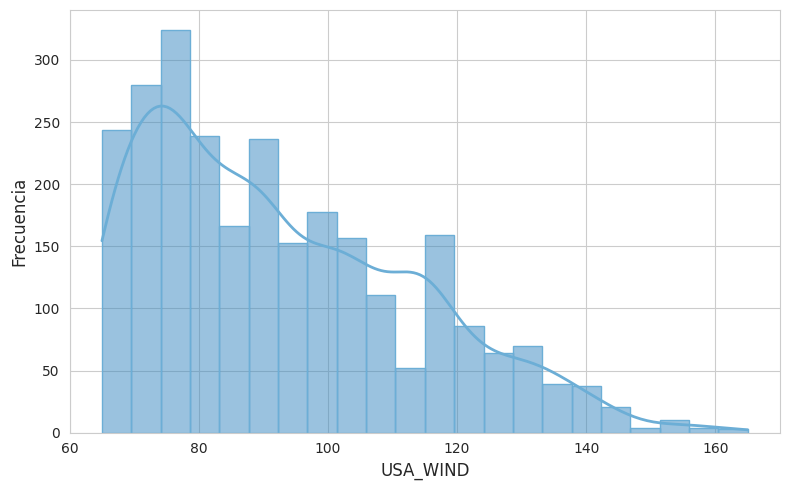

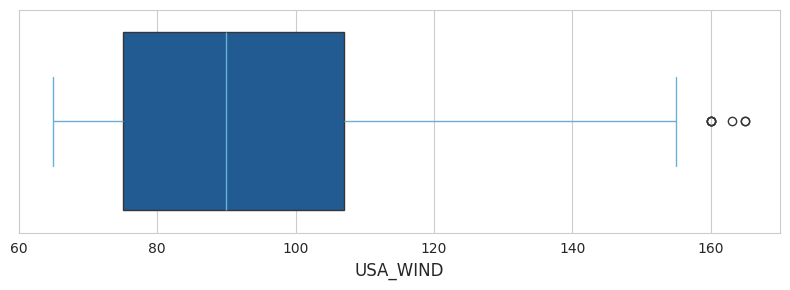

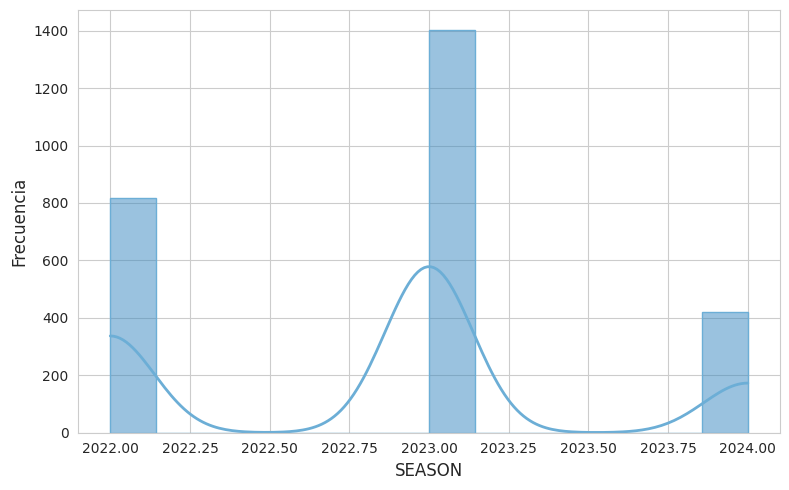

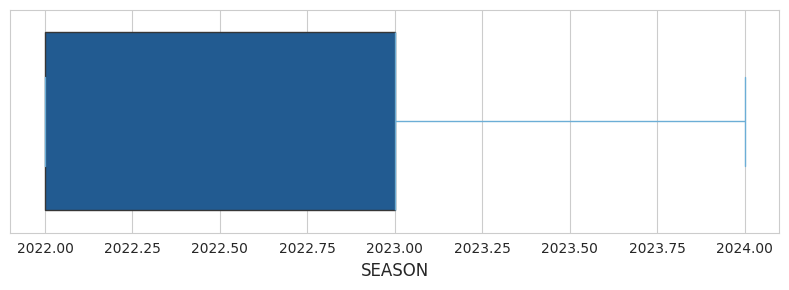

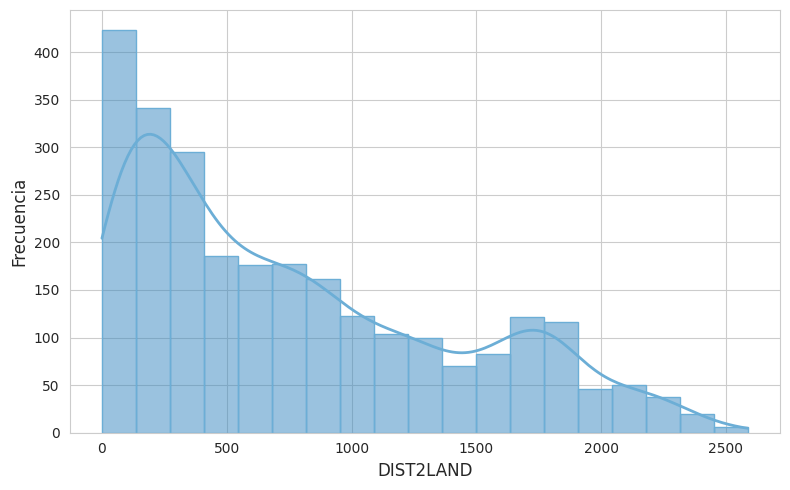

...

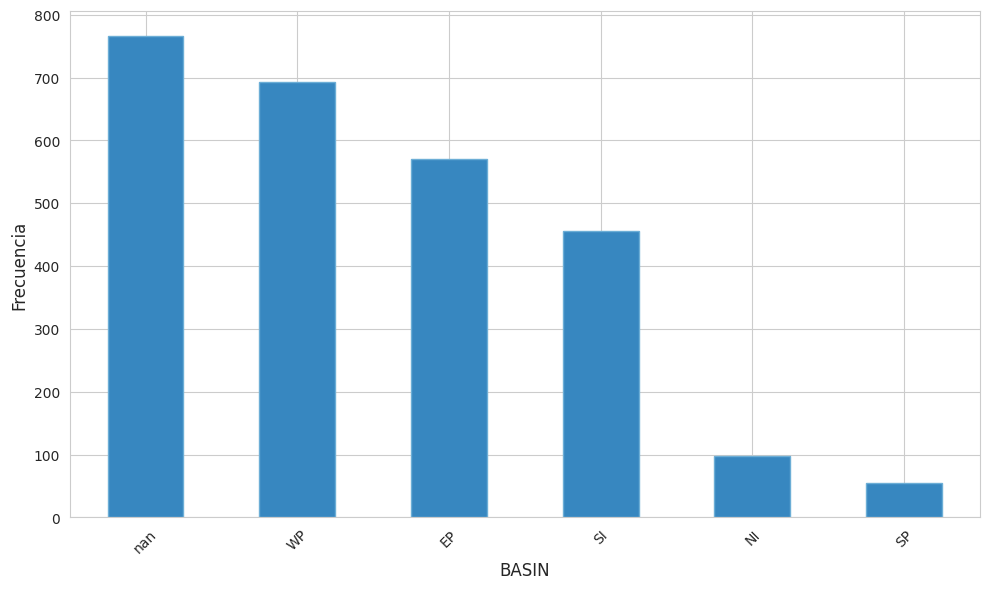

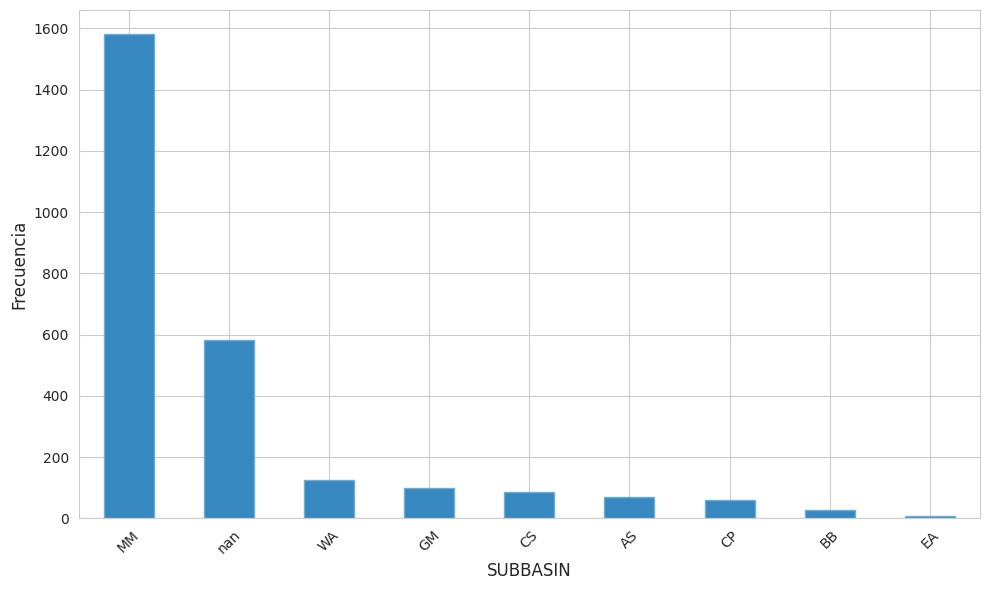

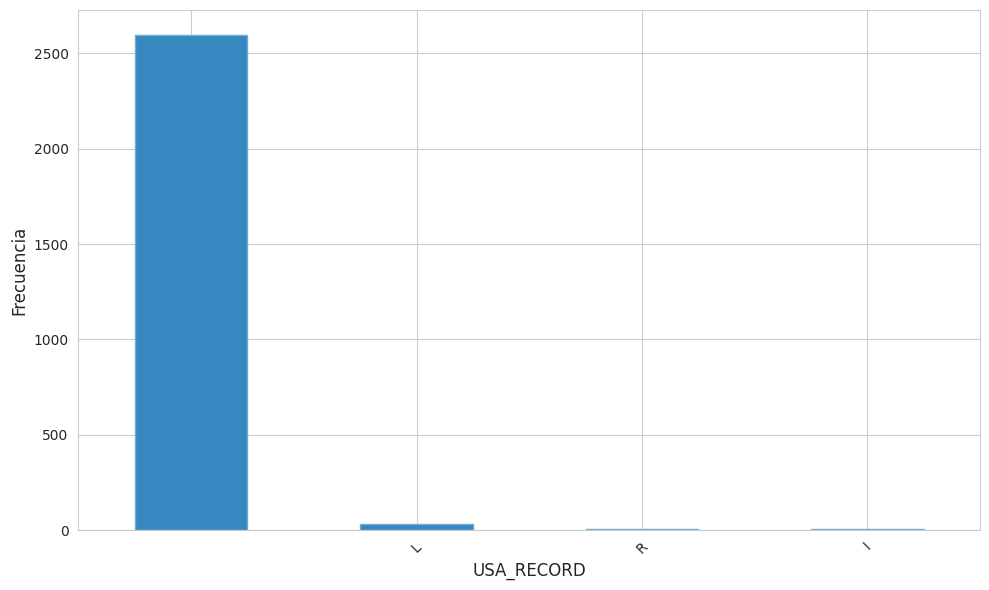

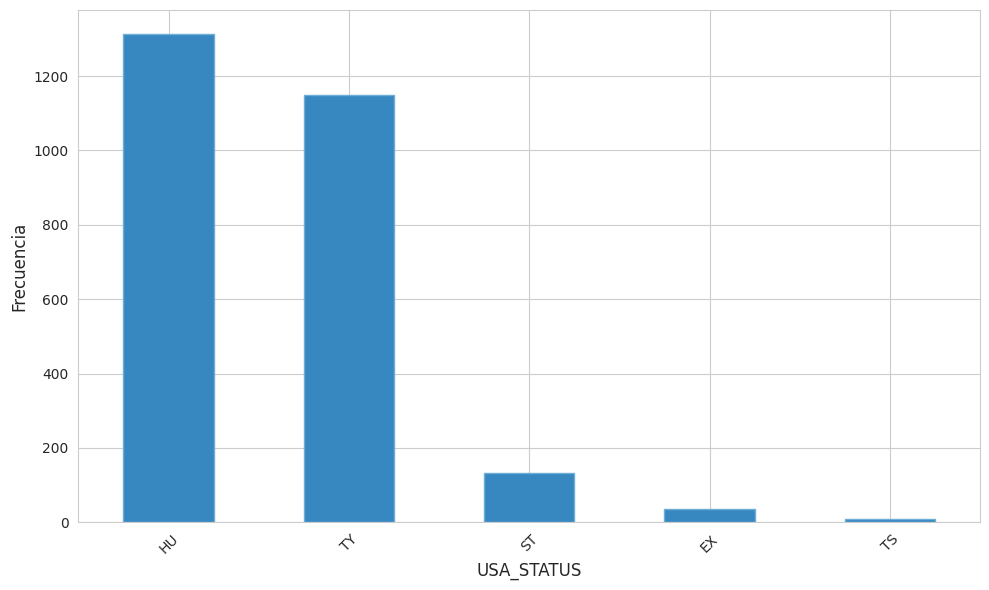

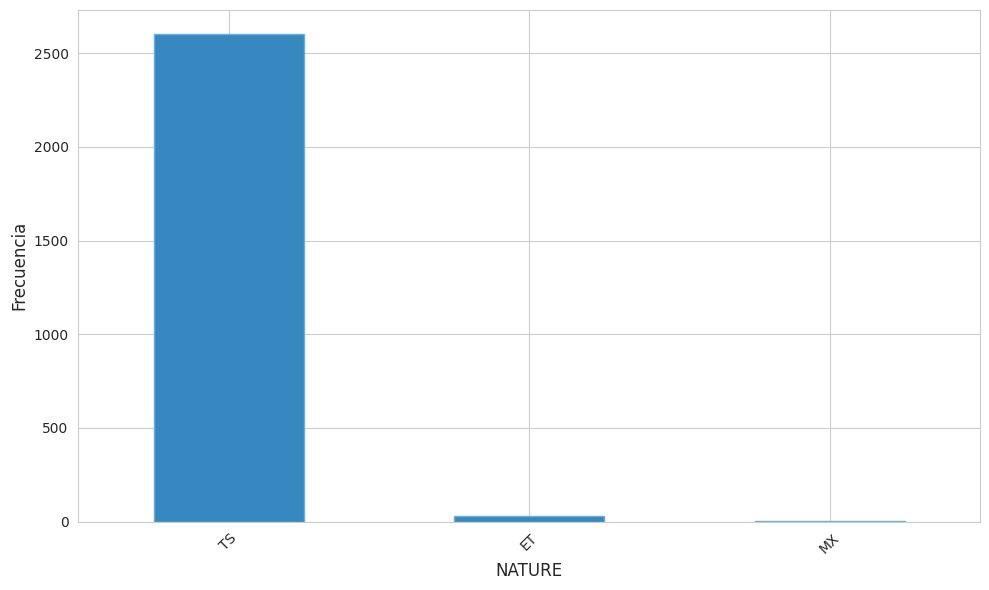

In [ ]:
# Configuración de estilo y paleta de colores azul claro
sns.set_style("whitegrid")
blue_palette = sns.color_palette("Blues_r", n_colors=5)
pale_blue = blue_palette[0]  # Azul más claro
light_blue = blue_palette[1]  # Azul claro
medium_blue = blue_palette[2]  # Azul medio

# Crear y guardar histogramas y boxplots por separado para cada variable numérica
for col in col_num:
    # --- HISTOGRAMA + KDE ---
    plt.figure(figsize=(8, 5))
    sns.histplot(df_[col], kde=True, color=light_blue, edgecolor=medium_blue)

    # Estilizar la curva KDE
    for line in plt.gca().get_lines():
        line.set_color(medium_blue)
        line.set_linewidth(2)

    plt.xlabel(col, fontsize=12)
    plt.ylabel('Frecuencia', fontsize=12)
    plt.tight_layout()
    plt.savefig(f'distribucion_{col}.png', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()  # Cierra la figura para evitar mostrarla en Jupyter

    # --- BOXPLOT ---
    plt.figure(figsize=(8, 3))
    sns.boxplot(x=df_[col], color=pale_blue)

    # Estilizar la línea de la mediana
    for line in plt.gca().lines:
        line.set_color(medium_blue)

    plt.xlabel(col, fontsize=12)
    plt.tight_layout()
    plt.savefig(f'boxplot_{col}.png', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

# Crear gráficas individuales para variables categóricas
for col in col_cat:
    plt.figure(figsize=(10, 6))
    ax = df_[col].value_counts().plot(kind='bar', color=light_blue, edgecolor=medium_blue)
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Frecuencia', fontsize=12)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig(f'frecuencia_{col}.png', dpi=300, bbox_inches='tight')
    plt.show()

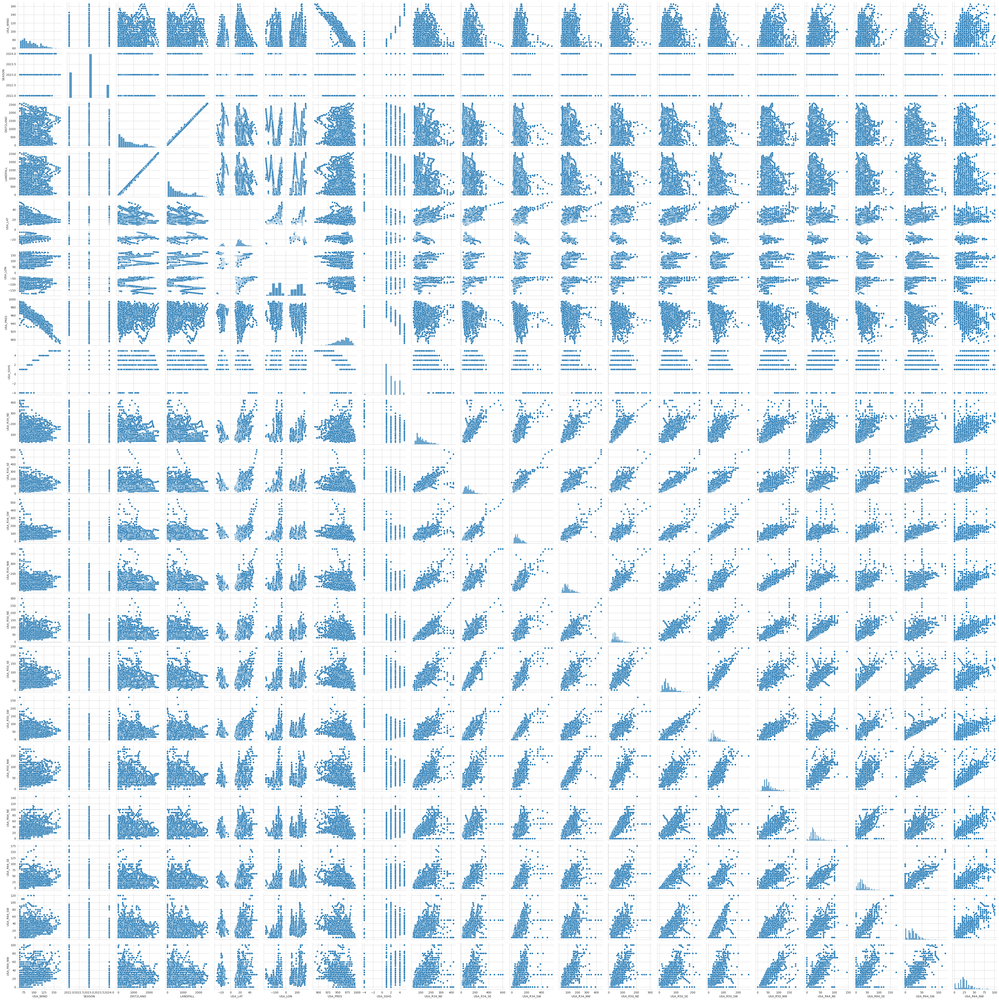

In [ ]:
# Gráfico de pares (pairplot) para ver relaciones entre variables numéricas
sns.pairplot(df_[col_num])

In [ ]:
# Creamos un nuevo DataFrame para el modelo
df_model = df_.copy()

# Codificamos variables categóricas en variables dummy (one-hot encoding)
dummies = pd.get_dummies(df_model[['BASIN', 'SUBBASIN', 'USA_RECORD', 'USA_STATUS', 'NATURE']], drop_first=True)

# Eliminamos las columnas originales categóricas
df_model.drop(['BASIN', 'SUBBASIN', 'USA_RECORD', 'USA_STATUS', 'NATURE'], axis=1, inplace=True)

# Unimos las variables dummy al DataFrame principal
df_model = pd.concat([df_model, dummies], axis=1)

# Extraemos características temporales desde la columna ISO_TIME
df_model['year'] = df_model['ISO_TIME'].dt.year
df_model['month'] = df_model['ISO_TIME'].dt.month
df_model['day'] = df_model['ISO_TIME'].dt.day
df_model['hour'] = df_model['ISO_TIME'].dt.hour
df_model['minute'] = df_model['ISO_TIME'].dt.minute

# Eliminamos la columna ISO_TIME ya transformada
df_model = df_model.drop(columns=['ISO_TIME'])

In [ ]:
# Verificamos estructura final del DataFrame para modelado
df_model.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2638 entries, 234 to 16719
Data columns (total 47 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   USA_WIND       2638 non-null   float64
 1   SEASON         2638 non-null   int64  
 2   DIST2LAND      2638 non-null   int64  
 3   LANDFALL       2638 non-null   float64
 4   USA_LAT        2638 non-null   float64
 5   USA_LON        2638 non-null   float64
 6   USA_PRES       2638 non-null   float64
 7   USA_SSHS       2638 non-null   int64  
 8   USA_R34_NE     2638 non-null   float64
 9   USA_R34_SE     2638 non-null   float64
 10  USA_R34_SW     2638 non-null   float64
 11  USA_R34_NW     2638 non-null   float64
 12  USA_R50_NE     2638 non-null   float64
 13  USA_R50_SE     2638 non-null   float64
 14  USA_R50_SW     2638 non-null   float64
 15  USA_R50_NW     2638 non-null   float64
 16  USA_R64_NE     2638 non-null   float64
 17  USA_R64_SE     2638 non-null   float64
 18  USA_R64_SW

In [ ]:
# Vista previa del DataFrame procesado
df_model.head()

,USA_WIND,SEASON,DIST2LAND,LANDFALL,USA_LAT,USA_LON,USA_PRES,USA_SSHS,USA_R34_NE,USA_R34_SE,...,USA_STATUS_ST,USA_STATUS_TS,USA_STATUS_TY,NATURE_MX,NATURE_TS,year,month,day,hour,minute
234,90.0,2022,2315,2215.0,-17.9,79.7,970.0,2,65.0,75.0,...,False,False,True,False,True,2022,1,27,12,0
235,78.0,2022,2205,2118.0,-18.2,78.7,979.0,1,65.0,70.0,...,False,False,True,False,True,2022,1,27,15,0
236,65.0,2022,2107,2008.0,-18.4,77.8,987.0,1,65.0,65.0,...,False,False,True,False,True,2022,1,27,18,0
250,75.0,2022,1288,1258.0,-17.9,69.8,979.0,1,40.0,40.0,...,False,False,True,False,True,2022,1,29,12,0
251,78.0,2022,1258,1219.0,-17.9,69.5,977.0,1,40.0,40.0,...,False,False,True,False,True,2022,1,29,15,0


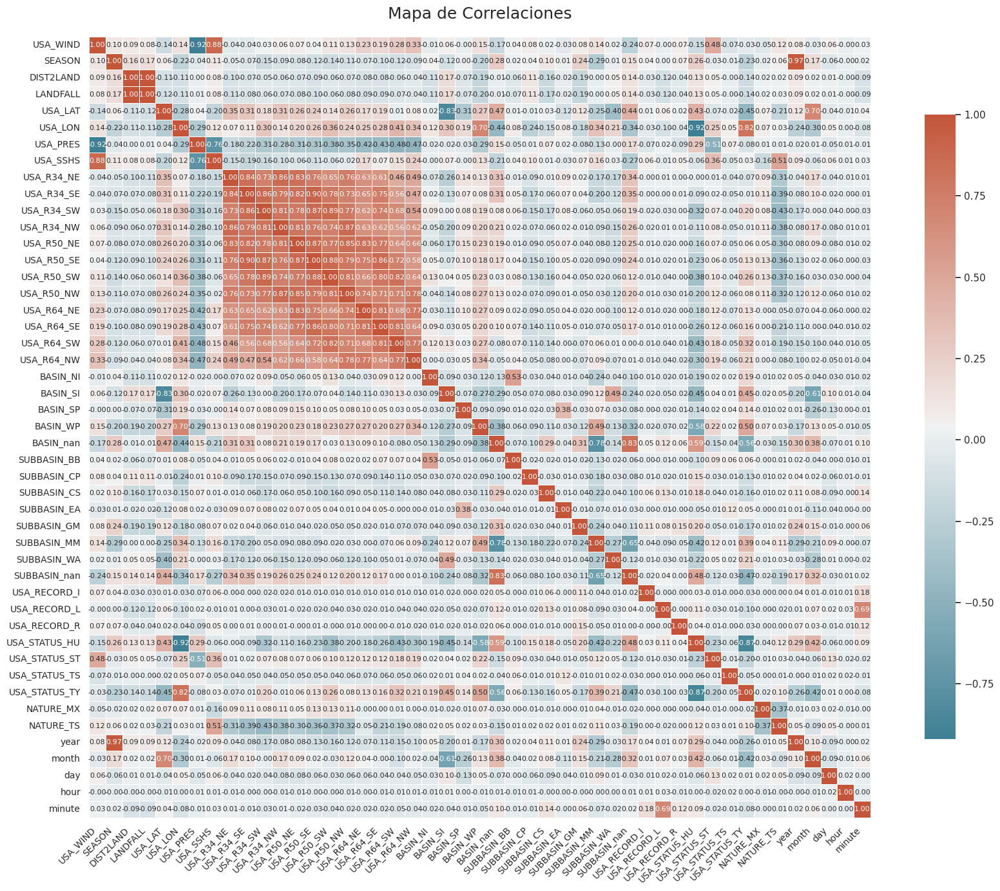

In [ ]:
# Mapa de correlación entre variables
sns.set_theme(style="white")
corr = df_model.corr()

plt.figure(figsize=(18, 14))
cmap = sns.diverging_palette(220, 20, as_cmap=True)

sns.heatmap(corr,
            cmap=cmap,
            annot=True,
            fmt=".2f",
            annot_kws={"size": 8},
            linewidths=0.5,
            square=True,
            cbar_kws={"shrink": 0.8},
            xticklabels=True,
            yticklabels=True)

plt.title("Mapa de Correlaciones", fontsize=18, pad=20)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)
plt.tight_layout()
plt.show()

## Entrenamiento del modelo

In [ ]:
# Definimos la variable objetivo
target_variable = 'USA_WIND'

# Eliminamos la variable objetivo del conjunto de entrada
X = df_model.drop(columns=[target_variable])

# Retiramos USA_SSHS: escala Saffir-Simpson, altamente correlacionada con la variable objetivo (~80%)
# Si se incluye, el modelo podría aprender a predecir USA_WIND casi exclusivamente con ella.
X = X.drop(columns=['USA_SSHS'])

# Retiramos USA_PRES: la presión atmosférica en el ojo del huracán también está fuertemente correlacionada con la velocidad del viento.
# Para forzar al modelo a usar otras variables menos evidentes, la eliminamos.
X = X.drop(columns=['USA_PRES'])

X = X.drop(columns=['SEASON'])
X = X.drop(columns=['year'])

# Asignamos la variable objetivo
Y = df_model[target_variable]


# División de datos en entrenamiento y prueba (80% / 20%)
X_train, X_test, y_train, y_test = train_test_split(
    X, Y, test_size=0.2, random_state=42
)

# Entrenamiento de un modelo de Random Forest para regresión
model = RandomForestRegressor(
    n_estimators=100,  # número de árboles
    random_state=42,   # reproducibilidad
    n_jobs=-1          # uso de todos los núcleos disponibles
)
model.fit(X_train, y_train)

RandomForestRegressor(n_jobs=-1, random_state=42)

In [ ]:
X.info() #variables que usa el modelo

<class 'pandas.core.frame.DataFrame'>
Index: 2638 entries, 234 to 16719
Data columns (total 42 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   DIST2LAND      2638 non-null   int64  
 1   LANDFALL       2638 non-null   float64
 2   USA_LAT        2638 non-null   float64
 3   USA_LON        2638 non-null   float64
 4   USA_R34_NE     2638 non-null   float64
 5   USA_R34_SE     2638 non-null   float64
 6   USA_R34_SW     2638 non-null   float64
 7   USA_R34_NW     2638 non-null   float64
 8   USA_R50_NE     2638 non-null   float64
 9   USA_R50_SE     2638 non-null   float64
 10  USA_R50_SW     2638 non-null   float64
 11  USA_R50_NW     2638 non-null   float64
 12  USA_R64_NE     2638 non-null   float64
 13  USA_R64_SE     2638 non-null   float64
 14  USA_R64_SW     2638 non-null   float64
 15  USA_R64_NW     2638 non-null   float64
 16  BASIN_NI       2638 non-null   bool   
 17  BASIN_SI       2638 non-null   bool   
 18  BASIN_SP  

In [ ]:
# Evaluamos la importancia de cada variable dentro del modelo
importances = model.feature_importances_
features = X_train.columns

# Creamos un DataFrame con la importancia de cada característica
importancia_df = pd.DataFrame({
    'feature': features,
    'importance': importances
}).sort_values(by='importance', ascending=False)

In [ ]:
# Mostramos las 15 variables más importantes según el modelo
importancia_df.head(15)

,feature,importance
33,USA_STATUS_ST,0.229045
14,USA_R64_SW,0.175282
2,USA_LAT,0.101837
3,USA_LON,0.099328
15,USA_R64_NW,0.067929
39,day,0.057665
0,DIST2LAND,0.029193
1,LANDFALL,0.023749
38,month,0.023461
4,USA_R34_NE,0.022928


In [ ]:
# Realizamos predicciones sobre el conjunto de prueba
y_pred = model.predict(X_test)

# Métricas de evaluación del modelo
rmse = np.sqrt(mean_squared_error(y_test, y_pred))  # Error cuadrático medio
mae = mean_absolute_error(y_test, y_pred)           # Error absoluto medio
r2 = r2_score(y_test, y_pred)                       # Coeficiente de determinación R^2

# Resultados del modelo
print(f'RMSE: {rmse:.2f} nodos')
print(f'MAE: {mae:.2f} nodos')
print(f'R^2: {r2:.3f}')

RMSE: 6.89 nodos
MAE: 4.71 nodos
R^2: 0.886


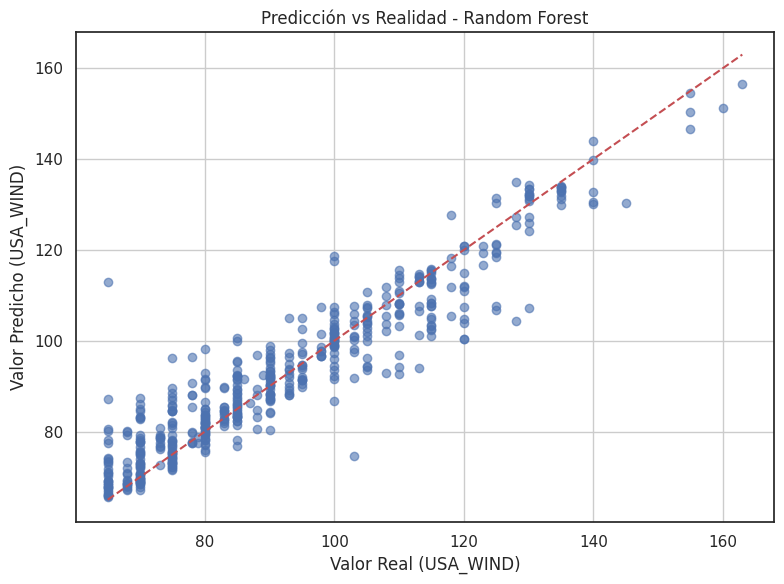

In [ ]:
# Gráfico de dispersión: valores reales vs. valores predichos
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')  # línea ideal
plt.xlabel('Valor Real (USA_WIND)')
plt.ylabel('Valor Predicho (USA_WIND)')
plt.title('Predicción vs Realidad - Random Forest')
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# UMAP: Reducción de dimensionalidad para visualización en 2D
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
embedding = reducer.fit_transform(X)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [ ]:
# Clustering con DBSCAN sobre los datos embebidos por UMAP
clusterer = DBSCAN(eps=0.5, min_samples=5)
labels = clusterer.fit_predict(embedding)

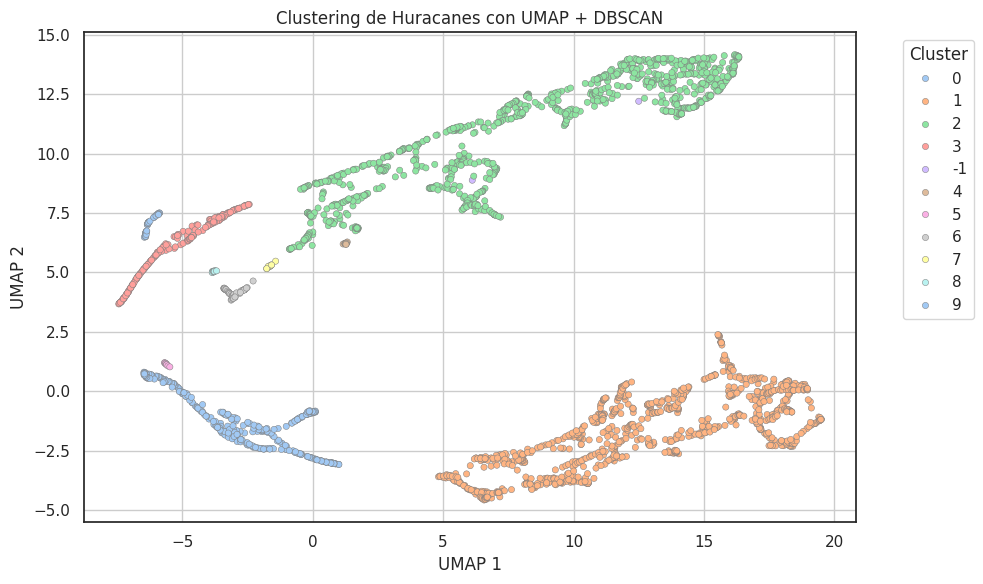

In [ ]:
# DataFrame con resultados
df_umap = pd.DataFrame({
    'UMAP_1': embedding[:, 0],
    'UMAP_2': embedding[:, 1],
    'Cluster': labels.astype(str)  # Convertimos a string para uso como categoría
})

# Visualización del clustering en 2D con seaborn
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_umap, x='UMAP_1', y='UMAP_2', hue='Cluster', palette='pastel', s=20, edgecolor='gray')

plt.title('Clustering de Huracanes con UMAP + DBSCAN')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()